In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
features_final = pd.read_csv("../../data/extracted_features_baseline_mean.csv")
train_groups = ['a', 'b', 'c', 'd']
train_features = features_final[features_final['group_id'].isin(train_groups)]
testing_features = features_final[features_final['group_id']== "e"]
feature_cols = ["Asymmetry", "Compactness", "Convexity", "Multicolor", "red_pixels", "blue_pixels", "mean_red", "mean_blue", "Entropy", "Hue_Var", "Sat_Var", "Val_Var","2_3_lesions"]

train_df = train_features[feature_cols + ["Class"]].copy()
train_df["label"] = train_df["Class"].astype(int)
train_df = train_df.drop(columns=["Class"])

In [2]:
#Extract X, y, and groups (for GroupKFold)
# Training data (groups a–d)
X_train = train_features[feature_cols].values
y_train = train_features["Class"].astype(int).values
groups_train = train_features["group_id"].values   # a, b, c, d

# Testing data (group e)
X_test = testing_features[feature_cols].values
y_test = testing_features["Class"].astype(int).values

In [3]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(
    max_iter=5000,
    solver="lbfgs",
    penalty="l2"
)


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.pipeline import Pipeline

pipe = Pipeline([
    ("scaler", StandardScaler()),
    
    ("feature_selector", SequentialFeatureSelector(
        logreg,                 
        direction="forward",    
        n_features_to_select="auto"
    )),
    
    ("logreg", logreg)          
])


In [5]:
param_grid = {
    "feature_selector__n_features_to_select": [4, 6, 8, 10, 12],
    "logreg__C": [0.01, 0.1, 1, 10, 100],
    "logreg__penalty": ["l2"],
    "logreg__solver": ["lbfgs"]
}


In [ ]:
from sklearn.model_selection import GroupKFold, GridSearchCV

# GroupKFold with 4 folds (groups a–d)
cv = GroupKFold(n_splits=4)

# GridSearchCV
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    cv=cv,
    scoring="f1",
    n_jobs=-1,
    verbose=2,
    error_score=np.nan   
)

# Fit on training data (groups a–d)
grid.fit(X_train, y_train, groups=groups_train)


print("Best parameters:", grid.best_params_)
print("Best CV F1 score:", grid.best_score_)


Fitting 4 folds for each of 25 candidates, totalling 100 fits


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=4, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.7s
[CV] END feature_selector__n_features_to_select=4, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.7s
[CV] END feature_selector__n_features_to_select=4, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=4, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.8s
[CV] END feature_selector__n_features_to_select=4, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.7s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=4, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.7s
[CV] END feature_selector__n_features_to_select=4, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.7s
[CV] END feature_selector__n_features_to_select=4, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=

/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=4, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s
[CV] END feature_selector__n_features_to_select=4, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.6s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=6, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.9s
[CV] END feature_selector__n_features_to_select=6, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s
[CV] END feature_selector__n_features_to_select=6, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s
[CV] END feature_selector__n_features_to_select=6, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s
[CV] END feature_selector__n_features_to_select=6, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.1s
[CV] END feature_selector__n_features_to_select=6, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=6, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.9s
[CV] END feature_selector__n_features_to_select=6, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s
[CV] END feature_selector__n_features_to_select=6, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s
[CV] END feature_selector__n_features_to_select=6, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=6, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.9s
[CV] END feature_selector__n_features_to_select=6, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s
[CV] END feature_selector__n_features_to_select=6, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s
[CV] END feature_selector__n_features_to_select=6, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.9s
[CV] END feature_selector__n_features_to_select=6, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   0.9s
[CV] END feature_selector__n_features_to_select=6, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.1s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=6, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s
[CV] END feature_selector__n_features_to_select=6, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s
[CV] END feature_selector__n_features_to_select=6, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.0s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=6, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.2s


ed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of

[CV] END feature_selector__n_features_to_select=8, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=8, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=8, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=8, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=8, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.4s
[CV] END feature_selector__n_features_to_select=8, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.6s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=8, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=8, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.6s
[CV] END feature_selector__n_features_to_select=8, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.7s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=8, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=8, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.3s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=8, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=8, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.4s
[CV] END feature_selector__n_features_to_select=8, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=8, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.6s
[CV] END feature_selector__n_features_to_select=8, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.4s
[CV] END feature_selector__n_features_to_select=8, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.3s
[CV] END feature_selector__n_features_to_select=8, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.3s
[CV] END feature_selector__n_features_to_select=8, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total tim

/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=8, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=10, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=10, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.3s
[CV] END feature_selector__n_features_to_select=10, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.4s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=10, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=10, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=10, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=10, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s
[CV] END feature_selector__n_features_to_select=10, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.6s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=10, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.7s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=10, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   1.5s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=10, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.2s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=10, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.2s
[CV] END feature_selector__n_features_to_select=10, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.2s
[CV] END feature_selector__n_features_to_select=10, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.5s
[CV] END feature_selector__n_features_to_select=10, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.3s
[CV] END feature_selector__n_features_to_select=10, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.2s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=10, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.4s
[CV] END feature_selector__n_features_to_select=10, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.5s
[CV] END feature_selector__n_features_to_select=10, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.4s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=10, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.7s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.6s
[CV] END feature_selector__n_features_to_select=12, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.5s
[CV] END feature_selector__n_features_to_select=12, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.4s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.6s
[CV] END feature_selector__n_features_to_select=12, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.6s
[CV] END feature_selector__n_features_to_select=12, logreg__C=0.01, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.6s
[CV] END feature_selector__n_features_to_select=12, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.5s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.5s
[CV] END feature_selector__n_features_to_select=12, logreg__C=0.1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.7s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   2.6s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   4.7s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   4.7s
[CV] END feature_selector__n_features_to_select=12, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   5.1s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   5.3s
[CV] END feature_selector__n_features_to_select=12, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   5.2s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=10, logreg__penalty=l2, logreg__solver=lbfgs; total time=   5.7s
[CV] END feature_selector__n_features_to_select=12, logreg__C=1, logreg__penalty=l2, logreg__solver=lbfgs; total time=   5.9s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   5.7s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   6.1s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

[CV] END feature_selector__n_features_to_select=12, logreg__C=100, logreg__penalty=l2, logreg__solver=lbfgs; total time=   6.8s


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

Best parameters: {'feature_selector__n_features_to_select': 4, 'logreg__C': 0.01, 'logreg__penalty': 'l2', 'logreg__solver': 'lbfgs'}
Best CV F1 score: 0.6551189519353955


/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/opt/anaconda3/envs/pdsproject/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be remov

In [7]:
best_pipe = grid.best_estimator_

selector = best_pipe.named_steps["feature_selector"]
mask = selector.get_support()

selected_features = [f for f, m in zip(feature_cols, mask) if m]

print("Selected features:", selected_features)
print("Number of selected features:", sum(mask))


Selected features: ['Multicolor', 'Hue_Var', 'Sat_Var', '2_3_lesions']
Number of selected features: 4


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score


best_model = grid.best_estimator_

# Predictions on the test set
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score

def print_metrics(y_test, y_pred, y_prob):
    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)

    print(f"Accuracy: {accuracy:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"AUC: {auc:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"F1 Score: {f1:.4f}")

print_metrics(y_test, y_pred, y_prob)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


print("\nClassification Report:")
print(classification_report(y_test, y_pred))


print("\nAUC:", roc_auc_score(y_test, y_prob))


Accuracy: 0.5228
Recall: 0.9385
AUC: 0.5016
Precision: 0.5244
F1 Score: 0.6728
Confusion Matrix:
[[ 12 166]
 [ 12 183]]

Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.07      0.12       178
           1       0.52      0.94      0.67       195

    accuracy                           0.52       373
   macro avg       0.51      0.50      0.40       373
weighted avg       0.51      0.52      0.41       373


AUC: 0.501584557764333


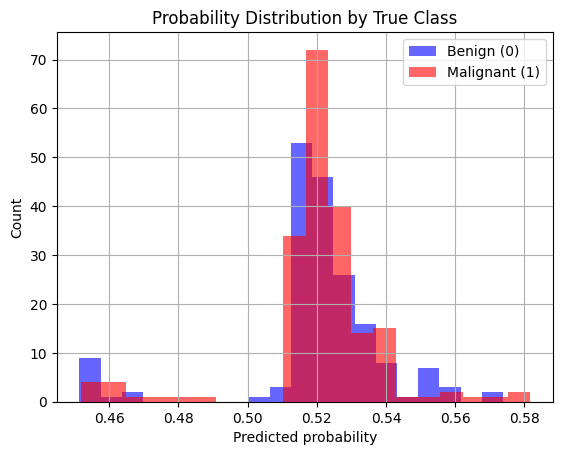

In [9]:
malignant_probs = y_prob[y_test == 1]
benign_probs = y_prob[y_test == 0]

plt.hist(benign_probs, bins=20, alpha=0.6, label="Benign (0)", color="blue")
plt.hist(malignant_probs, bins=20, alpha=0.6, label="Malignant (1)", color="red")

plt.xlabel("Predicted probability")
plt.ylabel("Count")
plt.title("Probability Distribution by True Class")
plt.legend()
plt.grid(True)
plt.show()